# Crop Segmentation with Sentinel2 and CDL Data

## Imports Python Function

In [2]:
import os
# os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

import numpy as np
from time import strftime,time, sleep
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score,recall_score, accuracy_score#, ConfusionMatrixDisplay

from torchgeo.datasets import stack_samples , CDL#, Sentinel2,IntersectionDataset,UnionDataset, RasterDataset,BoundingBox
from torchgeo.samplers import GridGeoSampler#, RandomGeoSampler
from torch.utils.data import DataLoader, random_split
import torch
from segmentation_models_pytorch import Unet #DeepLabV3Plus DeepLabV3, , Unet, UnetPlusPlus, MAnet, Linknet, FPN, PSPNet, PAN
torch_model=Unet
# My Functions
from visualize import train_show, plot_batch, plot_sentinel2, cdlplot, plot_bbox, results_show, save_metrics_to_excel
from util import random_seed, masknodata, union_CDL_sentinel2,is_non_empty, ConfidenceTransform
from trainloop import train_loop,test_step,apply_transforms

###Choosing Parameters
acc_fns     =[accuracy_score, precision_score, recall_score,  f1_score]#jaccard_score,
loss_fn=torch.nn.functional.cross_entropy

seed_value  = 1
random_seed(seed_value, use_cuda=True)
epochs     = 3
lr         =0.01
bright      =3/10000
## Choose GPU Number 
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

nWorkers=4
pWorkers=True
pin_memory=True


## Creating the Datasets

Next, we tell TorchGeo to automatically download the corresponding CDL labels.
Finally, we create an IntersectionDataset so that we can automatically sample from both GeoDatasets simultaneously.

We can prepare it to be loaded into a neural network. For that, we will create an instance of the RasterDataset class, provided by TorchGeo, and point to the specific directory, using the following commands. The `scale` function will apply the `1e-4`  scale necessary to get the Sentinel-2 values in reflectance. Once the datasets are created, we can combine images with masks (labels) using the `&` operator.

##### Important Crops In Study Region
""""
)  1: Corn
)  2: Cotton
)  3: Rice
)  4: Sorghum
)  5: Soybeans
)  6: Sunflower
)  10: Peanuts
)  11: Tobacco
)  12: Sweet Corn
)  13: Pop or Orn Corn
)  14: Mint
)  21: Barley
)  22: Durum Wheat
)  23: Spring Wheat
)  24: Winter Wheat
)  25: Other Small Grains
)  26: Dbl Crop WinWht/Soybeans
"""

### Train Dataset

In [6]:
starttime=time()
random_seed(seed_value, use_cuda=True)

bands       = ["B02","B03","B04","B05","B06","B07","B08","B08A","B11","B12",]
classes     = [0,1,2,3,5]#,3,5]#,24,26]
classes_name= ['Other', 'Corn', "Cotton",'Rice','Soybeans']#,'W_Wheat','DWheat_Soy']
nclasses    = len(classes)

# mtName={"accuracy_score"  : "Overall Accuracy",
#         "precision_score"  : "User Accuracy",
#         "recall_score"  : "Producer Accuracy",
#         "jaccard_score"   : "IoU",
#         "f1_score"   : "F1-Score"
#     }
#####################################################################################

# ### CDL Loading 
CDL2021paths=r"/hdd6/lb2002214/data/2023_30m_cdls/2023_30m_cdls.tif"
cdl2021Classes = CDL(paths=CDL2021paths , classes=classes)

### Build Transform for Filter CDL data based on confidence level.
# confidence_path = r"/hdd6/lb2002214/data/2021_30m_cdls/2021_30m_Confidence_Layer/2021_30m_confidence_layer.tif"
# transform = ConfidenceTransform(paths=confidence_path, threshold=1)
# cdl2021Classes = CDL(paths=CDL2021paths, classes=classes, transforms=transform)

print(vars(cdl2021Classes))

ordinal_cmap=cdl2021Classes.ordinal_cmap

AllTrainPaths=[]
### Sentinel-2 Data loading


AllTrainPaths.append([
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMedian_20235_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMedian_20236_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMedian_20237_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMedian_20238_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMedian_20239_30m.tif",
])


# AllTrainPaths.append([
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20235_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20236_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20237_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20238_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20239_30m.tif",
# ])

# AllTrainPaths.append([
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20235_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20236_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20237_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20238_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20239_30m.tif",
# ])

# AllTrainPaths.append([
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20235_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20236_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20237_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20238_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20239_30m.tif",
# ])

# AllTrainPaths.append([
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20235_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20236_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20237_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20238_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20239_30m.tif",
# ])

# AllTrainPaths.append([
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202305_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202306_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202307_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202308_30m.tif",
# "/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202309_30m.tif",
# ])

traindataset, individual_datasets = union_CDL_sentinel2(cdl2021Classes, AllTrainPaths, transforms=masknodata)

nbands      = len(bands)*len(AllTrainPaths[0])
print(f'band numbers= {nbands}' )

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

{'paths': '/hdd6/lb2002214/data/2023_30m_cdls/2023_30m_cdls.tif', 'years': [2021], 'classes': [0, 1, 2, 3, 5], 'download': False, 'checksum': False, 'ordinal_map': tensor([0, 1, 2, 3, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0

#### Max-WRNB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


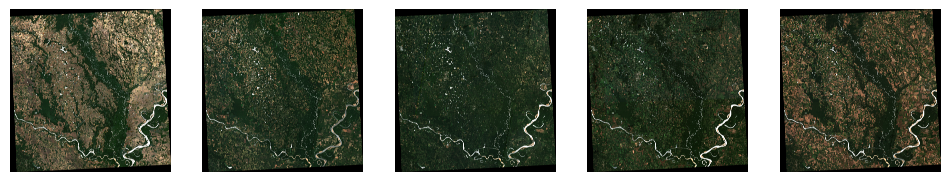

In [4]:
# plt.figure(figsize=(128, 128))
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

### Masked min

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


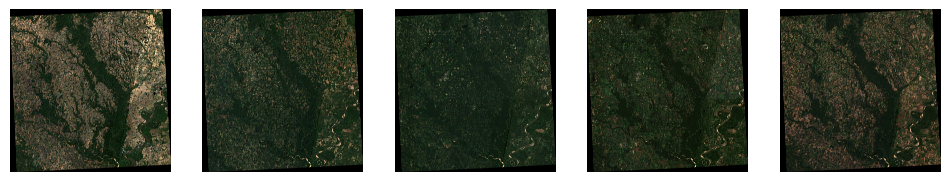

In [3]:
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

## Extract the bounds of the Sentinel-2 dataset
## Get a sample from the CDL dataset using these bounds
# cdl_sample = cdl2021Classes[individual_datasets['sentinel_datasets'][0].bounds]
# cdlplot(self=cdl2021Classes, sample=cdl_sample, show_titles=False)

### MAX-RNB
https://www.sciencedirect.com/science/article/pii/S0034425722004813?via%3Dihub
without mask

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


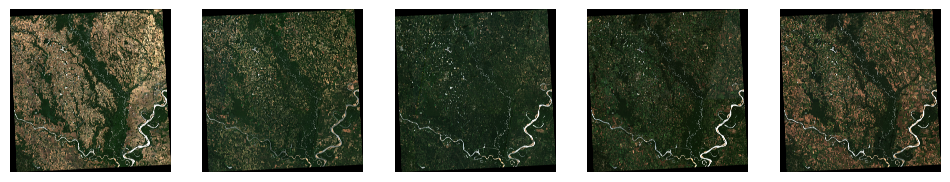

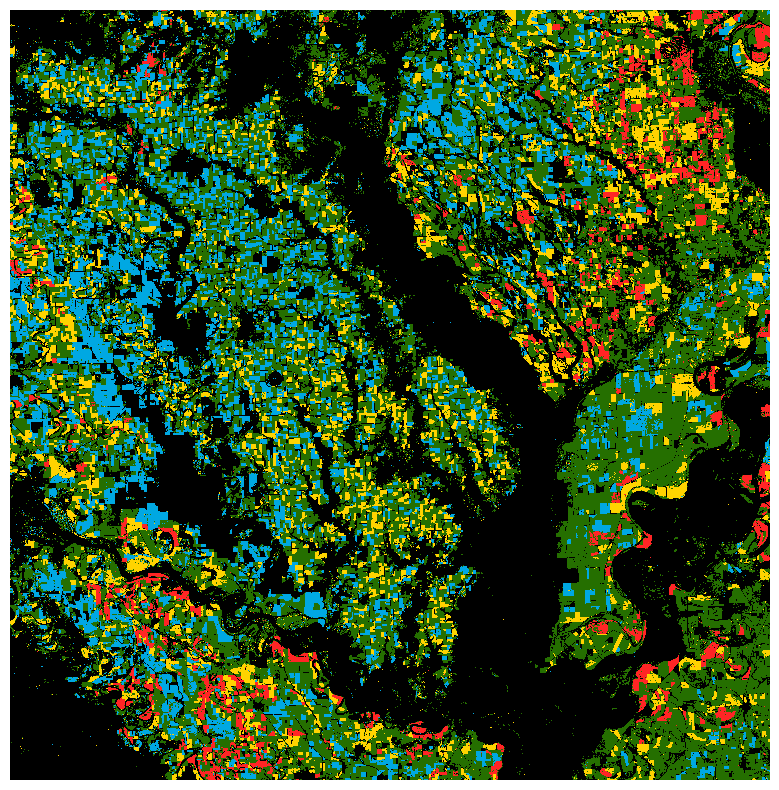

In [4]:
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

## Extract the bounds of the Sentinel-2 dataset
## Get a sample from the CDL dataset using these bounds
cdl_sample = cdl2021Classes[individual_datasets['sentinel_datasets'][0].bounds]
cdlplot(self=cdl2021Classes, sample=cdl_sample, show_titles=False)

## Train Dataloaders

To create training patches that can be fed into a neural network from our dataset, we need to select samples of fixed sizes. TorchGeo has many samplers, but here we will use the `RandomGeoSampler` class. Basically, the sampler selects random bounding boxes of fixed size that belongs to the original image. Then, these bounding boxes are used in the `RasterDataset` to query the portion of the image we want. Here is an example using the previously created samplers.

Creating a `DataLoader` in TorchGeo is very straightforward, just like it is with Pytorch (we are actually using the same class). Note below that we are also using the same samplers already defined. Additionally we inform the dataset that the dataloader will use to pull data from, the batch_size (number of samples in each batch) and a collate function that specifies how to “concatenate” the multiple samples into one single batch.

Finally, we can iterate through the dataloader to grab batches from it. To test it, we will get the first batch.

train_samples= 291, valid_samples=72



torch.Size([72, 50, 256, 256]) torch.float32 tensor(0.) tensor(15184.)
torch.Size([72, 1, 256, 256]) torch.int64 tensor(0) tensor(4)

 0.2  date: 2024-09-30 20:43:08


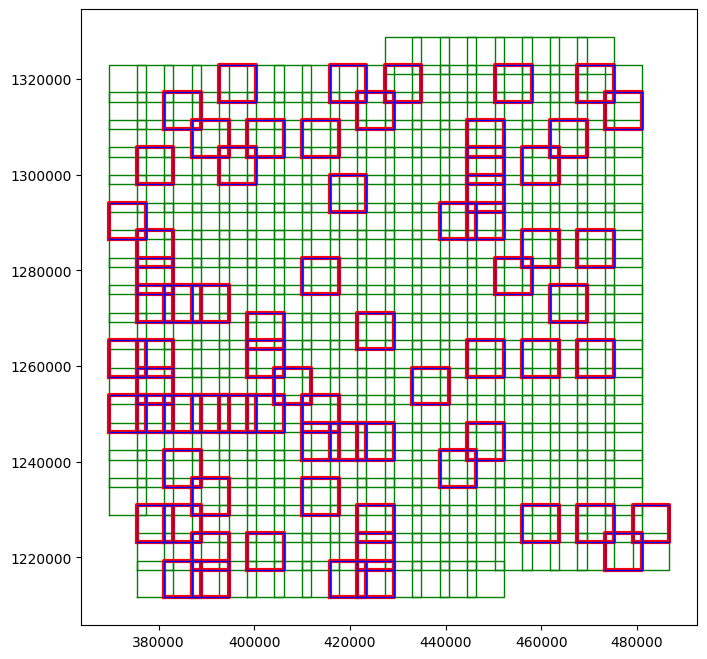

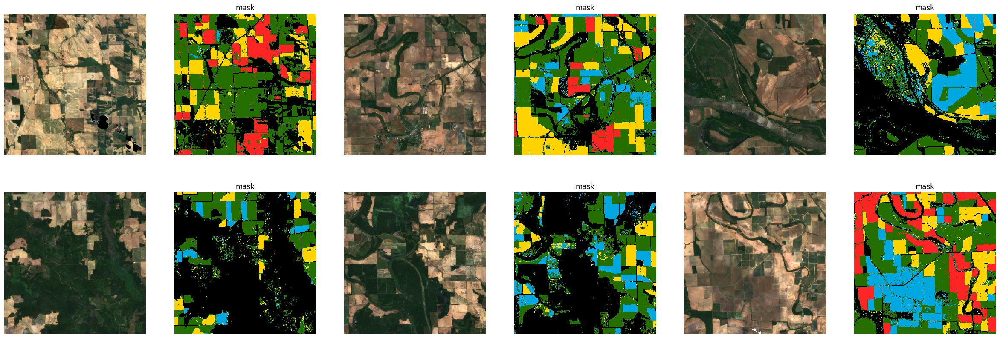

In [7]:
starttime=time()
random_seed(1, use_cuda=True)

#### Parameters
splitrat    = 0.8
batch_size  = 72
Size        = 256
Stride      = 192
###!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# sampleslist=[]
# for i in range(0,len(individual_datasets['sentinel_datasets']),len(AllTrainPaths[0])):
#     samples=GridGeoSampler(individual_datasets['sentinel_datasets'][i],stride=Stride,size=Size,)
#     sampleslist.extend(samples)

# # Filter out samples with empty data
# sampleslist = [index for index in sampleslist if is_non_empty(traindataset[index],threshold=0.5)]

# torch.save(sampleslist,f"sampleslist_T15SXU_2023_0.5_Size256_Stride192.pt")
sampleslist = torch.load("/home/lb2002214/PyTest/1-CropClass_Main/sampleslist/sampleslist_T15SXU_2023_0.5_Size256_Stride192.pt")

train_sampler,valid_sampler=random_split(sampleslist,[splitrat,1-splitrat]) # type: ignore

print(f"train_samples= {len(train_sampler)}, valid_samples={len(valid_sampler)}\n")
plt.figure(figsize=(8, 8))
plot_bbox(train_sampler,linewidth=1)
plot_bbox(valid_sampler,'r',linewidth=3)

train_dataloader    = DataLoader(traindataset, sampler=train_sampler, batch_size=batch_size, collate_fn=stack_samples, # type: ignore
                                 drop_last=True,num_workers=nWorkers,persistent_workers=pWorkers,pin_memory=pin_memory)
valid_dataloader    = DataLoader(traindataset, sampler=valid_sampler, batch_size=batch_size, collate_fn=stack_samples,  # type: ignore
                                 drop_last=True,num_workers=1,persistent_workers=pWorkers,pin_memory=pin_memory)

valid_batch = next(iter(valid_dataloader))
print(valid_batch["image"].shape, valid_batch["image"].dtype, valid_batch["image"].min(), valid_batch["image"].max())
print(valid_batch["mask"].shape, valid_batch["mask"].dtype, valid_batch["mask"].min(), valid_batch["mask"].max())
plot_bbox(valid_batch['bbox'],'b',linewidth=1)

chnls=np.array([2,1,0])
plot_batch(batch=valid_batch,ordinal_cmap=ordinal_cmap,chnls=chnls,bright=bright,rows=2,cols=6)
# plot_batch(batch=Valid_batch,ordinal_cmap=ordinal_cmap,chnls=chnls+10,bright=bright,cols=int(batch_size)) 
# plot_batch(batch=Valid_batch,ordinal_cmap=ordinal_cmap,chnls=chnls+20,bright=bright,cols=int(batch_size)) 


print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

#### Masked Median

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


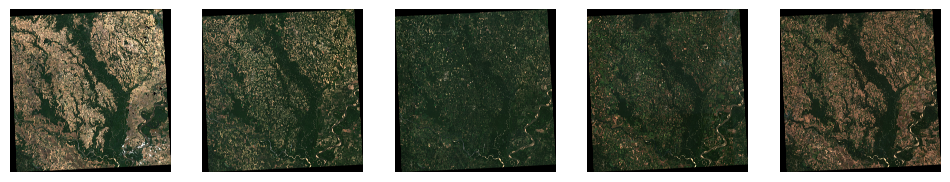

In [8]:
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

Epoch 0:	Train Loss=1.31363,	Validation Loss=39433063628800.00000,	Accuracy Metrics=[43.1, 15.84, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 1:	Train Loss=0.87762,	Validation Loss=9758720000.00000,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 2:	Train Loss=0.80837,	Validation Loss=63792020.00000,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 3:	Train Loss=0.72051,	Validation Loss=671185.75000,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 4:	Train Loss=0.63948,	Validation Loss=19491.00195,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 5:	Train Loss=0.56901,	Validation Loss=1065.63782,	Accuracy Metrics=[42.94, 22.62, 19.98, 12.37],	Lr=0.010000,	Best Model Saved!
Epoch 6:	Train Loss=0.53386,	Validation Loss=89.75939,	Accuracy Metrics=[39.92, 47.98, 24.12, 18.14],	Lr=0.010000,	Best Model Saved!
Epoch 7:	Train Loss=0.50916,	Validation Loss=7.9

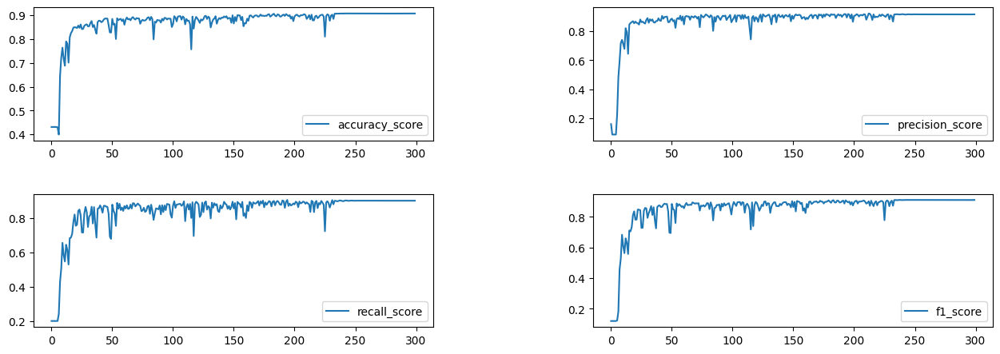

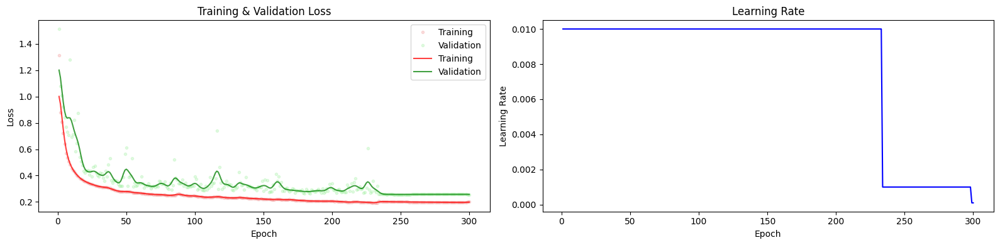


Best Model Test Data Classes Metrics
precision_score     recall_score        f1_score            
Other          :91.39, 93.24, 92.31
Corn           :93.56, 90.10, 91.80
Cotton         :92.15, 90.03, 91.08
Rice           :93.89, 90.06, 91.93
Soybeans       :87.67, 87.87, 87.77

Best Model Test Metrics:		90.75	91.73	90.26	90.98	
DataFrame saved to 'C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaskedMedian_20240930.xlsx'.

 52.2  date: 2024-09-30 21:35:56


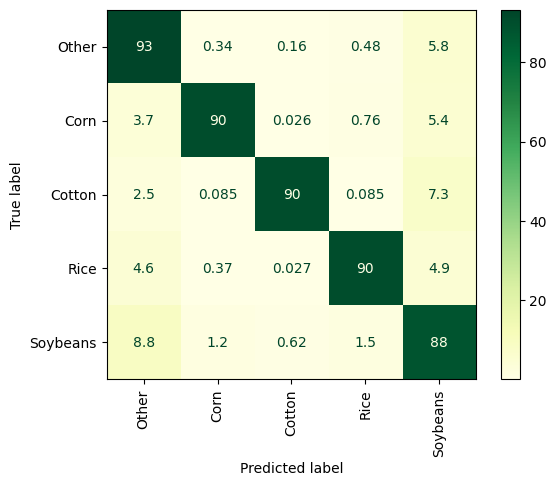

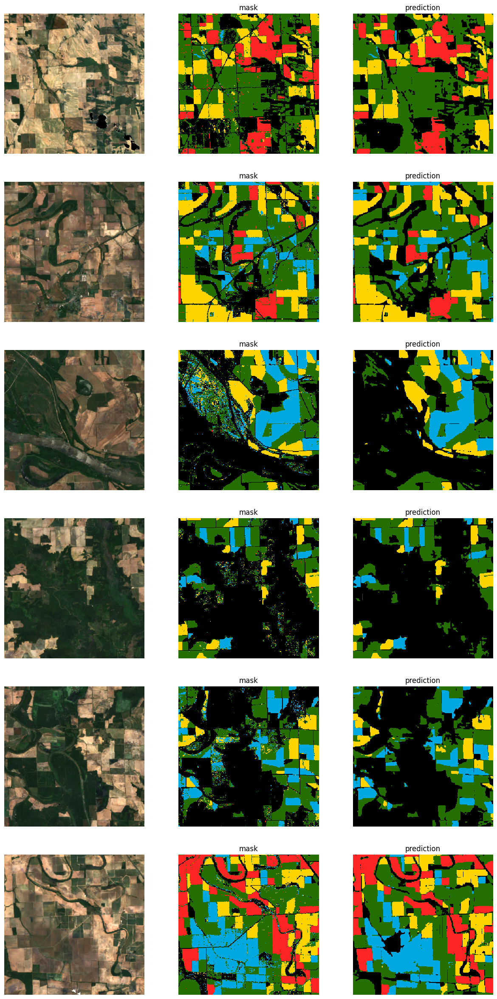

In [9]:
starttime=time()
random_seed(seed_value, use_cuda=True)

## Model, loss_function, optimizer
model = torch_model(classes= nclasses,in_channels=nbands)
optimizer = torch.optim.Adam(model.cuda().parameters(),lr=lr)

# ###lood model and optimazer
# bestmodel_results_saved=torch.load("bestmodel_results_practise.pt")
# model.load_state_dict(bestmodel_results_saved['model'])
# optimizer.load_state_dict(bestmodel_results_saved['optimizer'])

## Save
# savetime=strftime("%Y%m%d")
savename="C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaskedMedian_20240930"
# savename="practise"

#### Training and Evaluation
train_history,bestmodel_results=train_loop(250, model, train_dataloader, valid_dataloader, nclasses, loss_fn, optimizer,patience=50,
                                            batch_tfms=None,checkpoint_name=f"best_checkpoint_{savename}.pt")

torch.save(train_history, f"train_history_{savename}.pt")

### Showing Results
train_show(train_history,acc_fns)

best_model= torch_model(classes = nclasses,in_channels = nbands)
best_model.load_state_dict(bestmodel_results['model']) # type: ignore
valid_results = test_step(best_model, valid_dataloader, nclasses, loss_fn)
results_show(valid_results ,valid_dataloader, acc_fns, classes_name, ordinal_cmap, bright)
save_metrics_to_excel(acc_fns, classes_name, valid_results, savename)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

#### MaskedMaxWRNB

In [4]:
starttime=time()
random_seed(seed_value, use_cuda=True)

AllTrainPaths=[]
### Sentinel-2 Data loading

AllTrainPaths.append([
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20235_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20236_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20237_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20238_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20239_30m.tif",
])

traindataset, individual_datasets = union_CDL_sentinel2(cdl2021Classes, AllTrainPaths, transforms=masknodata)

train_dataloader    = DataLoader(traindataset, sampler=train_sampler, batch_size=batch_size, collate_fn=stack_samples, # type: ignore
                                 drop_last=True,num_workers=nWorkers,persistent_workers=pWorkers,pin_memory=pin_memory)
valid_dataloader    = DataLoader(traindataset, sampler=valid_sampler, batch_size=batch_size, collate_fn=stack_samples,  # type: ignore
                                 drop_last=True,num_workers=1,persistent_workers=pWorkers,pin_memory=pin_memory)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

Added new dataset 1-1: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20235_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-2: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20236_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-3: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxWRNB_20237_30m.tif', 'bands': [], 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


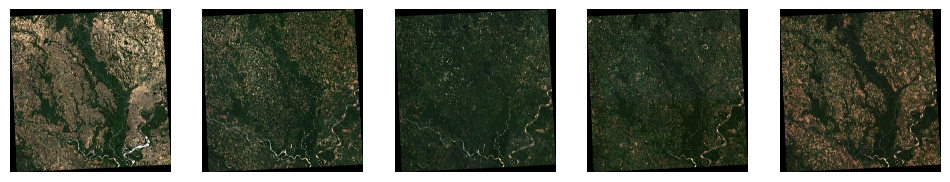

In [5]:
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

Epoch 0:	Train Loss=1.32233,	Validation Loss=187345231937536.00000,	Accuracy Metrics=[43.1, 15.01, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 1:	Train Loss=0.89912,	Validation Loss=6550702080.00000,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 2:	Train Loss=0.83132,	Validation Loss=9368335.00000,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 3:	Train Loss=0.77122,	Validation Loss=33941.17188,	Accuracy Metrics=[42.95, 16.63, 19.98, 12.34],	Lr=0.010000,	Best Model Saved!
Epoch 4:	Train Loss=0.69271,	Validation Loss=2739.78735,	Accuracy Metrics=[10.54, 16.91, 20.05, 4.92],	Lr=0.010000,	Best Model Saved!
Epoch 5:	Train Loss=0.64290,	Validation Loss=378.91263,	Accuracy Metrics=[31.65, 17.78, 20.0, 10.43],	Lr=0.010000,	Best Model Saved!
Epoch 6:	Train Loss=0.59487,	Validation Loss=36.70807,	Accuracy Metrics=[45.58, 48.4, 24.17, 19.41],	Lr=0.010000,	Best Model Saved!
Epoch 7:	Train Loss=0.53548,	Validation Loss=1.9

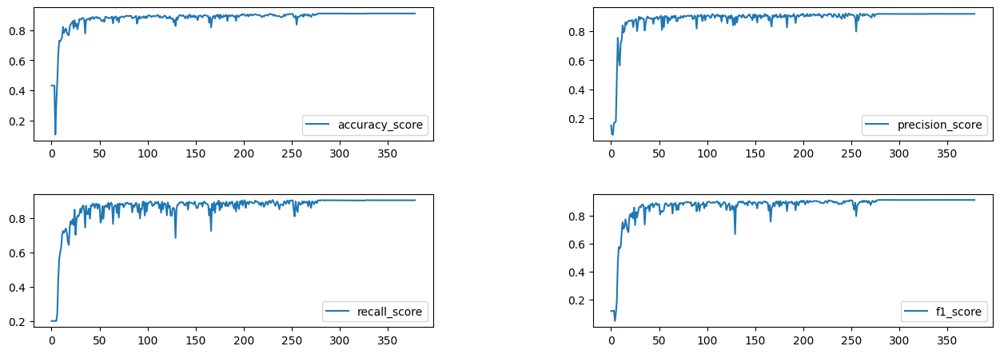

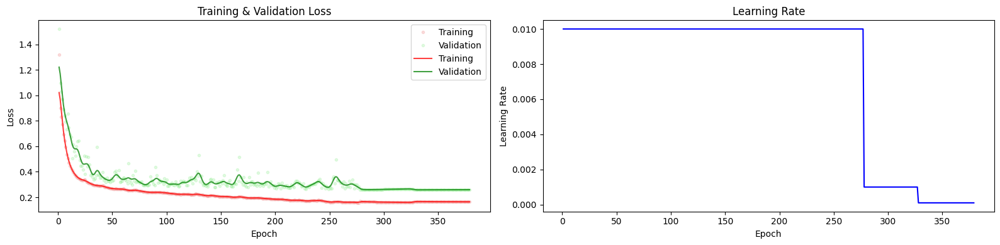


Best Model Test Data Classes Metrics
precision_score     recall_score        f1_score            
Other          :91.52, 93.96, 92.73
Corn           :93.51, 90.49, 91.97
Cotton         :91.84, 90.91, 91.37
Rice           :94.43, 89.82, 92.07
Soybeans       :88.41, 87.88, 88.14

Best Model Test Metrics:		91.10	91.94	90.61	91.26	
DataFrame saved to 'C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaskedMAXWRNB_20240930.xlsx'.

 69.4  date: 2024-09-30 20:01:46


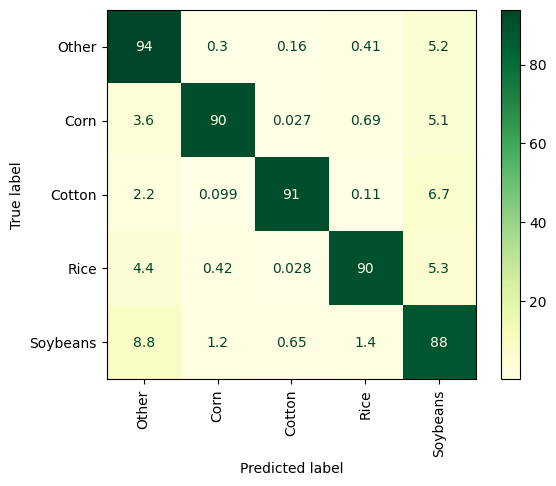

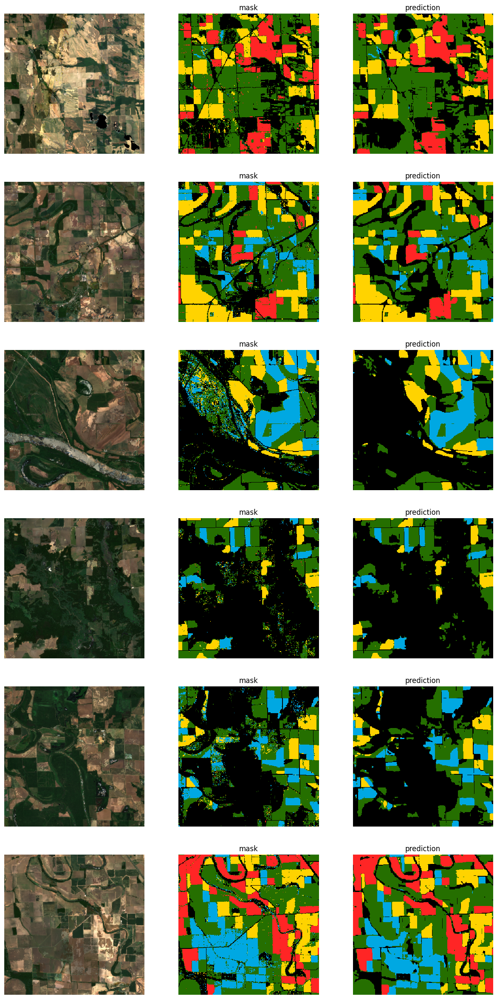

In [5]:
starttime=time()
random_seed(seed_value, use_cuda=True)

## Model, loss_function, optimizer
model = torch_model(classes= nclasses,in_channels=nbands)
optimizer = torch.optim.Adam(model.cuda().parameters(),lr=lr)

# ###lood model and optimazer
# bestmodel_results_saved=torch.load("bestmodel_results_practise.pt")
# model.load_state_dict(bestmodel_results_saved['model'])
# optimizer.load_state_dict(bestmodel_results_saved['optimizer'])

## Save
# savetime=strftime("%Y%m%d")
savename="C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaskedMAXWRNB_20240930"
# savename="practise"

#### Training and Evaluation
train_history,bestmodel_results=train_loop(250, model, train_dataloader, valid_dataloader, nclasses, loss_fn, optimizer,patience=50,
                                            batch_tfms=None,checkpoint_name=f"best_checkpoint_{savename}.pt")

torch.save(train_history, f"train_history_{savename}.pt")

### Showing Results
train_show(train_history,acc_fns)

best_model= torch_model(classes = nclasses,in_channels = nbands)
best_model.load_state_dict(bestmodel_results['model']) # type: ignore
valid_results = test_step(best_model, valid_dataloader, nclasses, loss_fn)
results_show(valid_results ,valid_dataloader, acc_fns, classes_name, ordinal_cmap, bright)
save_metrics_to_excel(acc_fns, classes_name, valid_results, savename)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

#### MaskedMaxRNB

In [10]:
starttime=time()
random_seed(seed_value, use_cuda=True)

AllTrainPaths=[]
### Sentinel-2 Data loading

AllTrainPaths.append([
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20235_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20236_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20237_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20238_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20239_30m.tif",
])

traindataset, individual_datasets = union_CDL_sentinel2(cdl2021Classes, AllTrainPaths, transforms=masknodata)

train_dataloader    = DataLoader(traindataset, sampler=train_sampler, batch_size=batch_size, collate_fn=stack_samples, # type: ignore
                                 drop_last=True,num_workers=nWorkers,persistent_workers=pWorkers,pin_memory=pin_memory)
valid_dataloader    = DataLoader(traindataset, sampler=valid_sampler, batch_size=batch_size, collate_fn=stack_samples,  # type: ignore
                                 drop_last=True,num_workers=1,persistent_workers=pWorkers,pin_memory=pin_memory)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

Added new dataset 1-1: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20235_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-2: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20236_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-3: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMaxRNB_20237_30m.tif', 'bands': [], 'ca

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


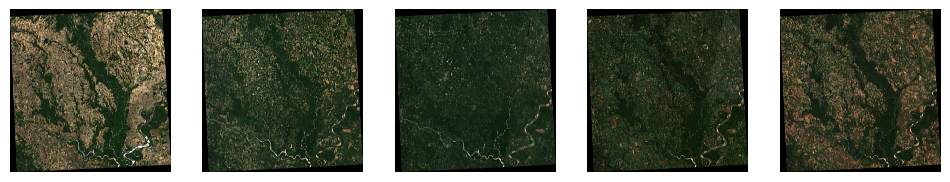

In [11]:
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

Epoch 0:	Train Loss=1.34652,	Validation Loss=48897254752256.00000,	Accuracy Metrics=[43.09, 9.23, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 1:	Train Loss=0.88133,	Validation Loss=217013136.00000,	Accuracy Metrics=[43.09, 9.27, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 2:	Train Loss=0.81588,	Validation Loss=455888.65625,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 3:	Train Loss=0.75900,	Validation Loss=16895.86719,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 4:	Train Loss=0.69892,	Validation Loss=726.17438,	Accuracy Metrics=[43.1, 8.62, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 5:	Train Loss=0.62157,	Validation Loss=67.21133,	Accuracy Metrics=[43.29, 44.27, 20.18, 12.49],	Lr=0.010000,	Best Model Saved!
Epoch 6:	Train Loss=0.56020,	Validation Loss=2.74453,	Accuracy Metrics=[61.05, 55.77, 34.23, 32.52],	Lr=0.010000,	Best Model Saved!
Epoch 7:	Train Loss=0.50927,	Validation Loss=1.37788,	Ac

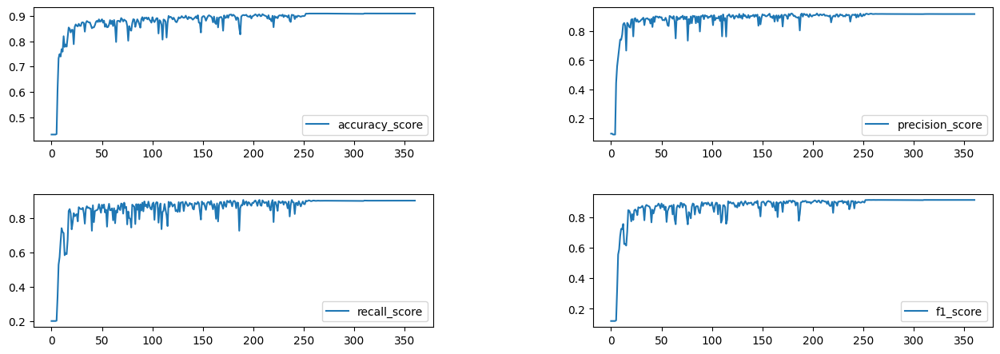

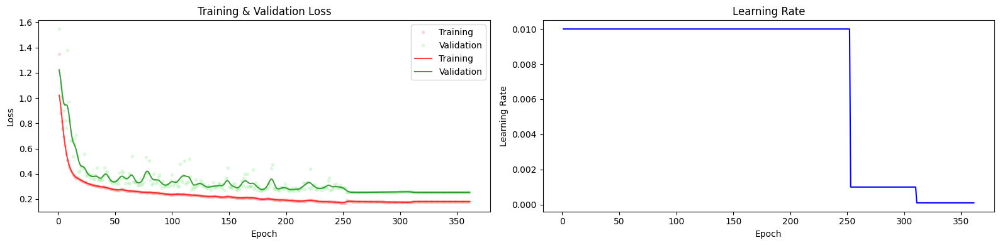


Best Model Test Data Classes Metrics
precision_score     recall_score        f1_score            
Other          :91.45, 93.72, 92.57
Corn           :93.44, 90.19, 91.79
Cotton         :92.34, 90.20, 91.26
Rice           :94.19, 89.80, 91.94
Soybeans       :88.17, 87.96, 88.07

Best Model Test Metrics:		90.97	91.92	90.38	91.13	
DataFrame saved to 'C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaskedMAXRNB_20240930.xlsx'.

 62.3  date: 2024-09-30 22:38:37


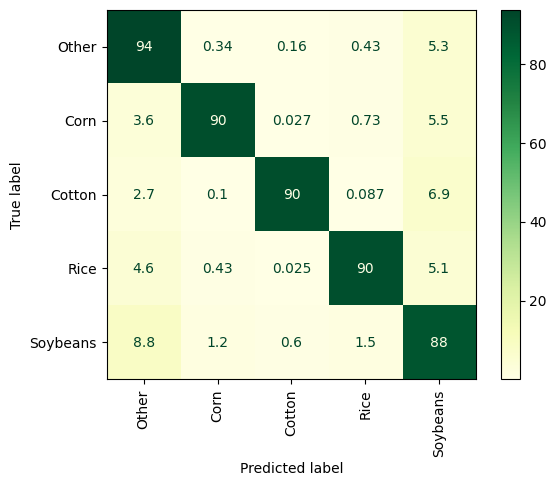

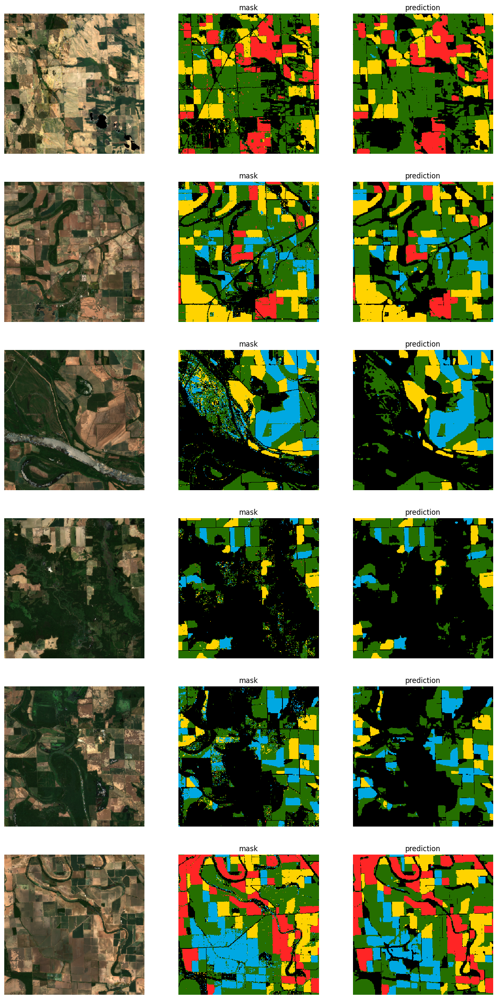

In [12]:
starttime=time()
random_seed(seed_value, use_cuda=True)

## Model, loss_function, optimizer
model = torch_model(classes= nclasses,in_channels=nbands)
optimizer = torch.optim.Adam(model.cuda().parameters(),lr=lr)

# ###lood model and optimazer
# bestmodel_results_saved=torch.load("bestmodel_results_practise.pt")
# model.load_state_dict(bestmodel_results_saved['model'])
# optimizer.load_state_dict(bestmodel_results_saved['optimizer'])

## Save
# savetime=strftime("%Y%m%d")
savename="C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaskedMAXRNB_20240930"
# savename="practise"

#### Training and Evaluation
train_history,bestmodel_results=train_loop(250, model, train_dataloader, valid_dataloader, nclasses, loss_fn, optimizer,patience=50,
                                            batch_tfms=None,checkpoint_name=f"best_checkpoint_{savename}.pt")

torch.save(train_history, f"train_history_{savename}.pt")

### Showing Results
train_show(train_history,acc_fns)

best_model= torch_model(classes = nclasses,in_channels = nbands)
best_model.load_state_dict(bestmodel_results['model']) # type: ignore
valid_results = test_step(best_model, valid_dataloader, nclasses, loss_fn)
results_show(valid_results ,valid_dataloader, acc_fns, classes_name, ordinal_cmap, bright)
save_metrics_to_excel(acc_fns, classes_name, valid_results, savename)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

#### MaxRNB

In [13]:
starttime=time()
random_seed(seed_value, use_cuda=True)

AllTrainPaths=[]
### Sentinel-2 Data loading

AllTrainPaths.append([
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20235_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20236_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20237_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20238_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20239_30m.tif",
])

traindataset, individual_datasets = union_CDL_sentinel2(cdl2021Classes, AllTrainPaths, transforms=masknodata)

train_dataloader    = DataLoader(traindataset, sampler=train_sampler, batch_size=batch_size, collate_fn=stack_samples, # type: ignore
                                 drop_last=True,num_workers=nWorkers,persistent_workers=pWorkers,pin_memory=pin_memory)
valid_dataloader    = DataLoader(traindataset, sampler=valid_sampler, batch_size=batch_size, collate_fn=stack_samples,  # type: ignore
                                 drop_last=True,num_workers=1,persistent_workers=pWorkers,pin_memory=pin_memory)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

Added new dataset 1-1: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20235_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-2: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20236_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-3: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_RNB_20237_30m.tif', 'bands': [], 'cache': True, 'band_indexes':

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


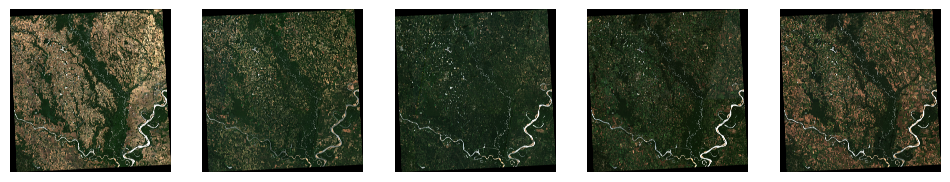

In [14]:
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

Epoch 0:	Train Loss=1.42491,	Validation Loss=697465309233152.00000,	Accuracy Metrics=[42.95, 8.59, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 1:	Train Loss=0.92604,	Validation Loss=6563449344.00000,	Accuracy Metrics=[42.95, 8.59, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 2:	Train Loss=0.83486,	Validation Loss=19261554.00000,	Accuracy Metrics=[42.95, 8.59, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 3:	Train Loss=0.77982,	Validation Loss=105126.87500,	Accuracy Metrics=[42.95, 8.59, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 4:	Train Loss=0.73111,	Validation Loss=3881.23560,	Accuracy Metrics=[42.95, 8.59, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 5:	Train Loss=0.67517,	Validation Loss=288.62549,	Accuracy Metrics=[42.95, 28.28, 20.0, 12.03],	Lr=0.010000,	Best Model Saved!
Epoch 6:	Train Loss=0.61335,	Validation Loss=46.31112,	Accuracy Metrics=[43.35, 39.7, 20.45, 13.02],	Lr=0.010000,	Best Model Saved!
Epoch 7:	Train Loss=0.55059,	Validation Loss=4.

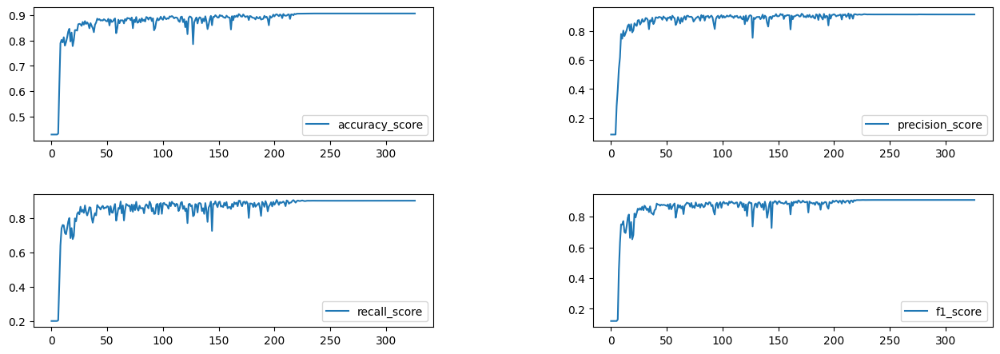

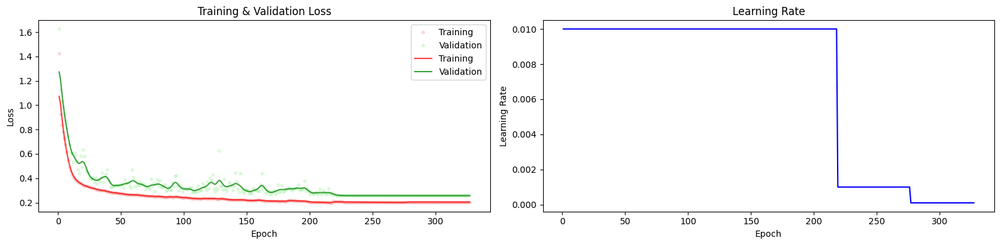


Best Model Test Data Classes Metrics
precision_score     recall_score        f1_score            
Other          :91.69, 92.65, 92.17
Corn           :93.68, 89.85, 91.73
Cotton         :91.71, 90.32, 91.01
Rice           :93.76, 89.94, 91.81
Soybeans       :86.96, 88.35, 87.65

Best Model Test Metrics:		90.61	91.56	90.22	90.87	
DataFrame saved to 'C0-1-2-3-5_B5-6-7-8-9_T15SXU_MAXRNB_20240930.xlsx'.

 57.6  date: 2024-09-30 23:36:38


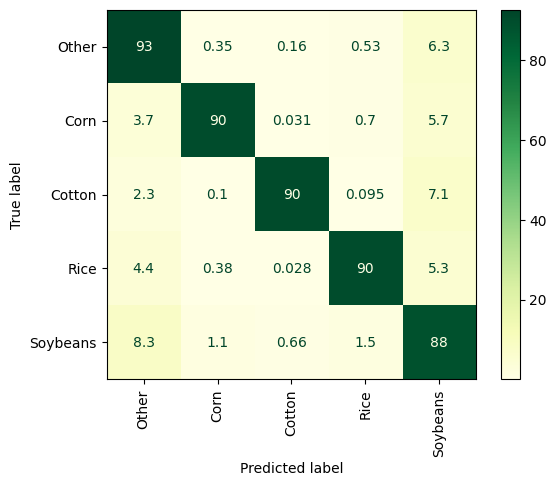

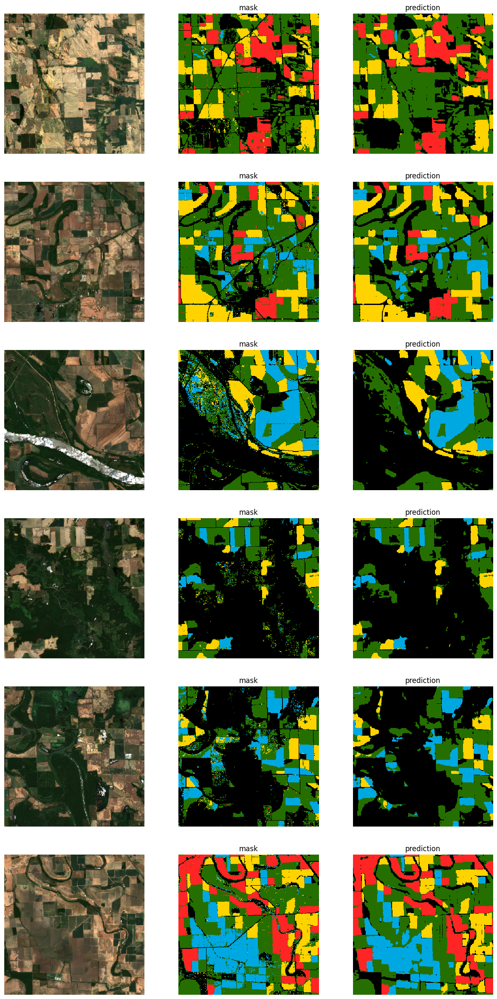

In [15]:
starttime=time()
random_seed(seed_value, use_cuda=True)

## Model, loss_function, optimizer
model = torch_model(classes= nclasses,in_channels=nbands)
optimizer = torch.optim.Adam(model.cuda().parameters(),lr=lr)

# ###lood model and optimazer
# bestmodel_results_saved=torch.load("bestmodel_results_practise.pt")
# model.load_state_dict(bestmodel_results_saved['model'])
# optimizer.load_state_dict(bestmodel_results_saved['optimizer'])

## Save
# savetime=strftime("%Y%m%d")
savename="C0-1-2-3-5_B5-6-7-8-9_T15SXU_MAXRNB_20240930"
# savename="practise"

#### Training and Evaluation
train_history,bestmodel_results=train_loop(250, model, train_dataloader, valid_dataloader, nclasses, loss_fn, optimizer,patience=50,
                                            batch_tfms=None,checkpoint_name=f"best_checkpoint_{savename}.pt")

torch.save(train_history, f"train_history_{savename}.pt")

### Showing Results
train_show(train_history,acc_fns)

best_model= torch_model(classes = nclasses,in_channels = nbands)
best_model.load_state_dict(bestmodel_results['model']) # type: ignore
valid_results = test_step(best_model, valid_dataloader, nclasses, loss_fn)
results_show(valid_results ,valid_dataloader, acc_fns, classes_name, ordinal_cmap, bright)
save_metrics_to_excel(acc_fns, classes_name, valid_results, savename)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

#### MaxWRNB

In [16]:
starttime=time()
random_seed(seed_value, use_cuda=True)

AllTrainPaths=[]
### Sentinel-2 Data loading

AllTrainPaths.append([
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20235_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20236_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20237_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20238_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20239_30m.tif",
])

traindataset, individual_datasets = union_CDL_sentinel2(cdl2021Classes, AllTrainPaths, transforms=masknodata)

train_dataloader    = DataLoader(traindataset, sampler=train_sampler, batch_size=batch_size, collate_fn=stack_samples, # type: ignore
                                 drop_last=True,num_workers=nWorkers,persistent_workers=pWorkers,pin_memory=pin_memory)
valid_dataloader    = DataLoader(traindataset, sampler=valid_sampler, batch_size=batch_size, collate_fn=stack_samples,  # type: ignore
                                 drop_last=True,num_workers=1,persistent_workers=pWorkers,pin_memory=pin_memory)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

Added new dataset 1-1: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20235_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-2: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20236_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-3: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_Max-WRNB_20237_30m.tif', 'bands': [], 'cache': True, 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


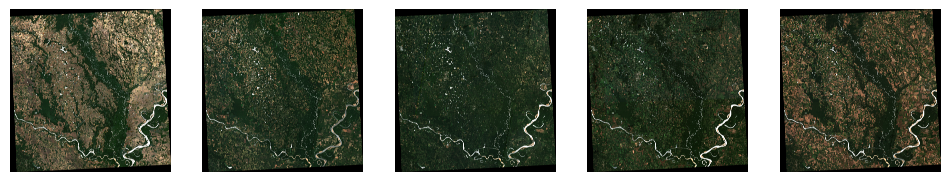

In [17]:
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

Epoch 0:	Train Loss=1.32191,	Validation Loss=7207920953458688.00000,	Accuracy Metrics=[42.95, 15.81, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 1:	Train Loss=0.91199,	Validation Loss=8262685184.00000,	Accuracy Metrics=[42.95, 15.81, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 2:	Train Loss=0.80056,	Validation Loss=8195804.50000,	Accuracy Metrics=[42.95, 15.81, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 3:	Train Loss=0.68988,	Validation Loss=74928.24219,	Accuracy Metrics=[42.95, 15.81, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 4:	Train Loss=0.61689,	Validation Loss=3114.41113,	Accuracy Metrics=[42.95, 15.91, 20.0, 12.02],	Lr=0.010000,	Best Model Saved!
Epoch 5:	Train Loss=0.55766,	Validation Loss=81.57805,	Accuracy Metrics=[46.1, 54.36, 23.24, 18.56],	Lr=0.010000,	Best Model Saved!
Epoch 6:	Train Loss=0.52050,	Validation Loss=3.51036,	Accuracy Metrics=[66.23, 64.11, 43.68, 46.09],	Lr=0.010000,	Best Model Saved!
Epoch 7:	Train Loss=0.48554,	Validation Loss

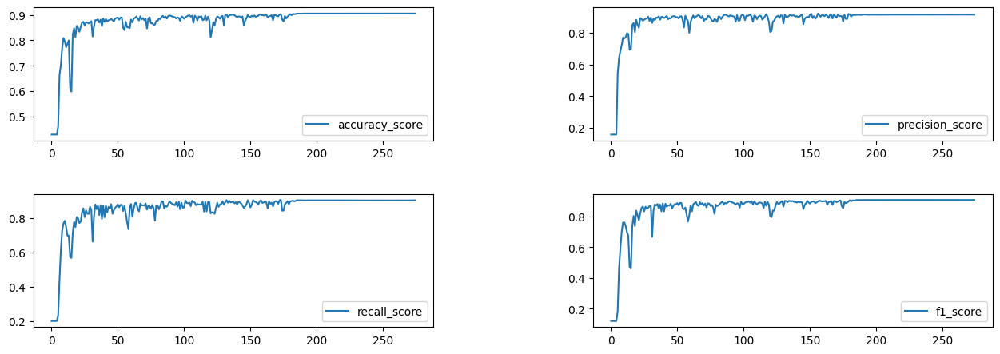

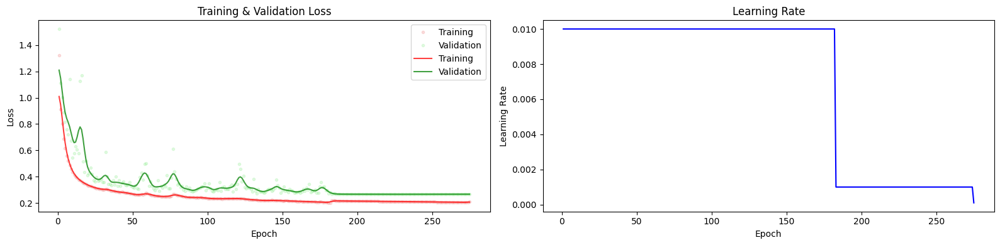


Best Model Test Data Classes Metrics
precision_score     recall_score        f1_score            
Other          :91.05, 93.23, 92.13
Corn           :93.14, 90.05, 91.57
Cotton         :91.92, 90.18, 91.04
Rice           :93.65, 89.88, 91.73
Soybeans       :87.77, 87.38, 87.57

Best Model Test Metrics:		90.56	91.51	90.15	90.81	
DataFrame saved to 'C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaxWRNB_20240930.xlsx'.

 48.6  date: 2024-10-01 00:25:40


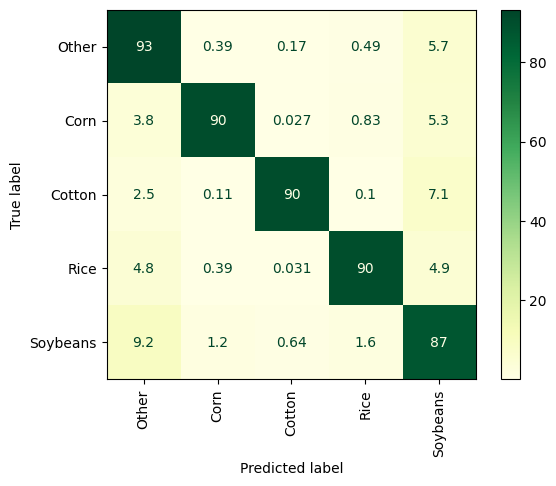

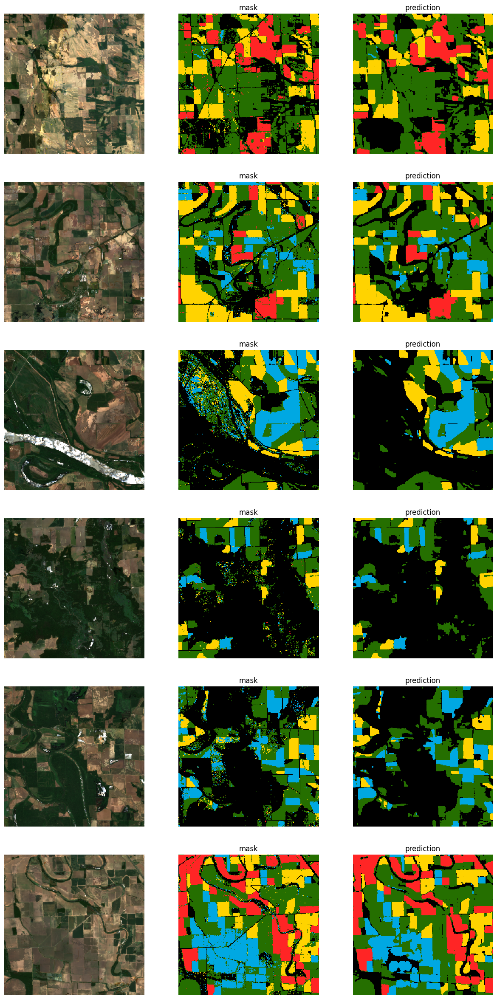

In [18]:
starttime=time()
random_seed(seed_value, use_cuda=True)

## Model, loss_function, optimizer
model = torch_model(classes= nclasses,in_channels=nbands)
optimizer = torch.optim.Adam(model.cuda().parameters(),lr=lr)

# ###lood model and optimazer
# bestmodel_results_saved=torch.load("bestmodel_results_practise.pt")
# model.load_state_dict(bestmodel_results_saved['model'])
# optimizer.load_state_dict(bestmodel_results_saved['optimizer'])

## Save
# savetime=strftime("%Y%m%d")
savename="C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaxWRNB_20240930"
# savename="practise"

#### Training and Evaluation
train_history,bestmodel_results=train_loop(250, model, train_dataloader, valid_dataloader, nclasses, loss_fn, optimizer,patience=50,
                                            batch_tfms=None,checkpoint_name=f"best_checkpoint_{savename}.pt")

torch.save(train_history, f"train_history_{savename}.pt")

### Showing Results
train_show(train_history,acc_fns)

best_model= torch_model(classes = nclasses,in_channels = nbands)
best_model.load_state_dict(bestmodel_results['model']) # type: ignore
valid_results = test_step(best_model, valid_dataloader, nclasses, loss_fn)
results_show(valid_results ,valid_dataloader, acc_fns, classes_name, ordinal_cmap, bright)
save_metrics_to_excel(acc_fns, classes_name, valid_results, savename)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

#### MaskedMin

In [19]:
starttime=time()
random_seed(seed_value, use_cuda=True)

AllTrainPaths=[]
### Sentinel-2 Data loading

AllTrainPaths.append([
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202305_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202306_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202307_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202308_30m.tif",
"/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202309_30m.tif",
])

traindataset, individual_datasets = union_CDL_sentinel2(cdl2021Classes, AllTrainPaths, transforms=masknodata)

train_dataloader    = DataLoader(traindataset, sampler=train_sampler, batch_size=batch_size, collate_fn=stack_samples, # type: ignore
                                 drop_last=True,num_workers=nWorkers,persistent_workers=pWorkers,pin_memory=pin_memory)
valid_dataloader    = DataLoader(traindataset, sampler=valid_sampler, batch_size=batch_size, collate_fn=stack_samples,  # type: ignore
                                 drop_last=True,num_workers=1,persistent_workers=pWorkers,pin_memory=pin_memory)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

Added new dataset 1-1: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202305_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-2: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202306_30m.tif', 'bands': [], 'cache': True, 'band_indexes': None, '_crs': CRS.from_epsg(5070), '_res': 30.0}
Added new dataset 1-3: {'transforms': None, 'index': rtree.index.Index(bounds=[369645.0, 483735.0, 1211655.0, 1327395.0, 0.0, 9.223372036854776e+18], size=1), 'paths': '/hdd6/lb2002214/data/Sentinel-2_2023/T15SXU/S2_SR_HARMONIZED_T15SXU_MaskedMin_202307_30m.tif', 'bands': [], 'cache': 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


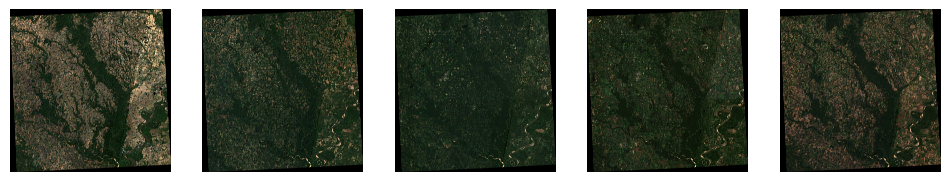

In [20]:
plt.figure(figsize=(12, 6))
for i, plotSen2 in enumerate(individual_datasets['sentinel_datasets']):
    plt.subplot(1,len(individual_datasets['sentinel_datasets']),i+1)
    plot_sentinel2(plotSen2.__getitem__(plotSen2.bounds),chnls=[2,1,0],bright=bright)

Epoch 0:	Train Loss=1.33167,	Validation Loss=212654668906496.00000,	Accuracy Metrics=[43.09, 9.17, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 1:	Train Loss=0.89932,	Validation Loss=1242211200.00000,	Accuracy Metrics=[43.1, 15.56, 20.0, 12.05],	Lr=0.010000,	Best Model Saved!
Epoch 2:	Train Loss=0.83016,	Validation Loss=365509.37500,	Accuracy Metrics=[43.03, 14.89, 19.99, 12.18],	Lr=0.010000,	Best Model Saved!
Epoch 3:	Train Loss=0.76867,	Validation Loss=3153.47729,	Accuracy Metrics=[43.03, 14.9, 19.99, 12.18],	Lr=0.010000,	Best Model Saved!
Epoch 4:	Train Loss=0.69082,	Validation Loss=104.82884,	Accuracy Metrics=[43.18, 30.04, 20.16, 12.62],	Lr=0.010000,	Best Model Saved!
Epoch 5:	Train Loss=0.63891,	Validation Loss=9.89282,	Accuracy Metrics=[47.24, 44.05, 25.5, 22.16],	Lr=0.010000,	Best Model Saved!
Epoch 6:	Train Loss=0.59653,	Validation Loss=4.77551,	Accuracy Metrics=[47.33, 47.79, 25.66, 22.44],	Lr=0.010000,	Best Model Saved!
Epoch 7:	Train Loss=0.55886,	Validation Loss=2.08

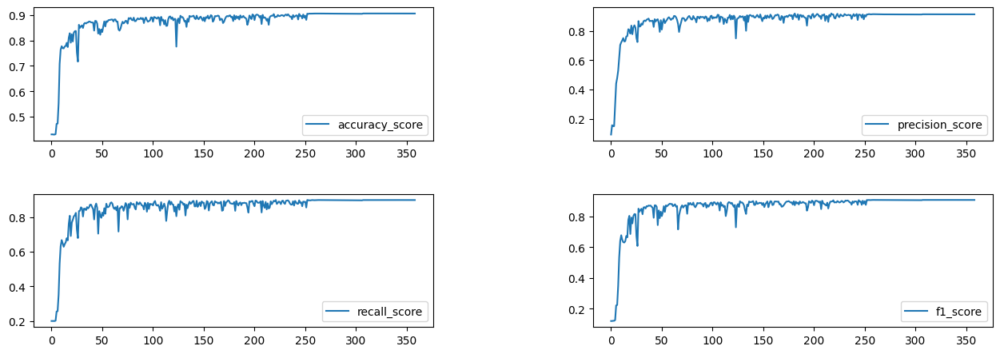

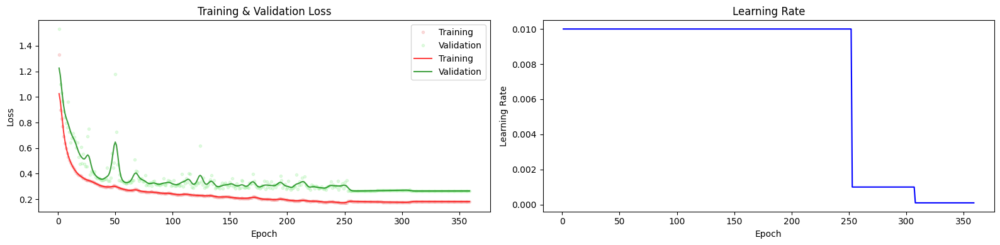


Best Model Test Data Classes Metrics
precision_score     recall_score        f1_score            
Other          :91.51, 93.10, 92.30
Corn           :93.31, 89.54, 91.39
Cotton         :91.45, 90.16, 90.80
Rice           :93.96, 89.56, 91.71
Soybeans       :87.12, 87.89, 87.50

Best Model Test Metrics:		90.58	91.47	90.05	90.74	
DataFrame saved to 'C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaskedMin_20240930.xlsx'.

 66.0  date: 2024-10-01 01:32:08


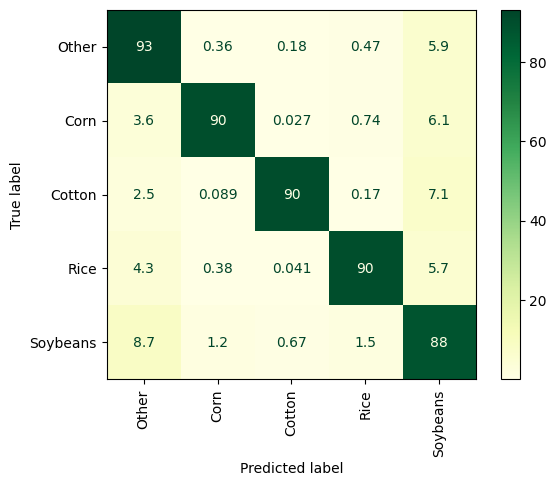

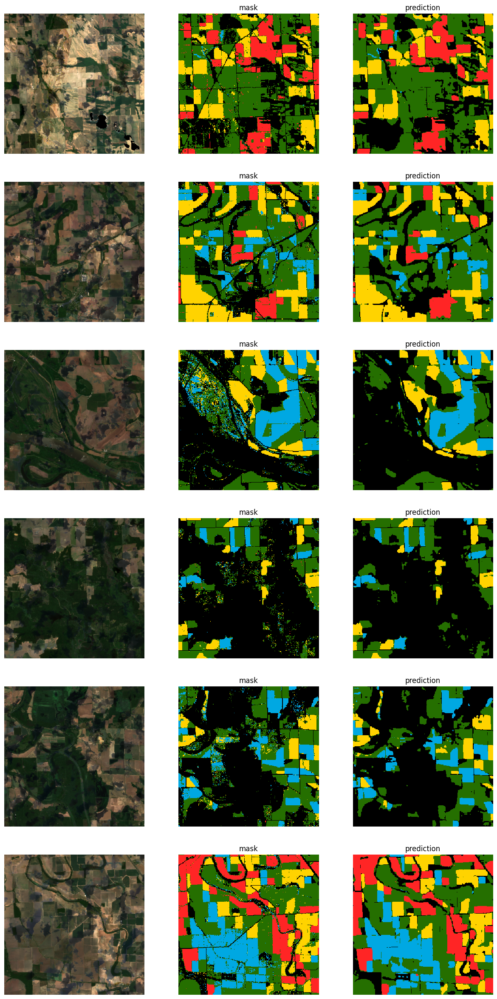

In [21]:
starttime=time()
random_seed(seed_value, use_cuda=True)

## Model, loss_function, optimizer
model = torch_model(classes= nclasses,in_channels=nbands)
optimizer = torch.optim.Adam(model.cuda().parameters(),lr=lr)

# ###lood model and optimazer
# bestmodel_results_saved=torch.load("bestmodel_results_practise.pt")
# model.load_state_dict(bestmodel_results_saved['model'])
# optimizer.load_state_dict(bestmodel_results_saved['optimizer'])

## Save
# savetime=strftime("%Y%m%d")
savename="C0-1-2-3-5_B5-6-7-8-9_T15SXU_MaskedMin_20240930"
# savename="practise"

#### Training and Evaluation
train_history,bestmodel_results=train_loop(250, model, train_dataloader, valid_dataloader, nclasses, loss_fn, optimizer,patience=50,
                                            batch_tfms=None,checkpoint_name=f"best_checkpoint_{savename}.pt")

torch.save(train_history, f"train_history_{savename}.pt")

### Showing Results
train_show(train_history,acc_fns)

best_model= torch_model(classes = nclasses,in_channels = nbands)
best_model.load_state_dict(bestmodel_results['model']) # type: ignore
valid_results = test_step(best_model, valid_dataloader, nclasses, loss_fn)
results_show(valid_results ,valid_dataloader, acc_fns, classes_name, ordinal_cmap, bright)
save_metrics_to_excel(acc_fns, classes_name, valid_results, savename)

print("\n",round((time()-starttime)/60,1),' date:',strftime("%Y-%m-%d %H:%M:%S"))

In [15]:
sleep(10*60)
import IPython
app = IPython.Application.instance()
app.kernel.do_shutdown(True)


{'status': 'ok', 'restart': True}

: 